In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

# **Imports, config, and auto-locate the dataset**

In [2]:
import os, random
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageStat
Image.MAX_IMAGE_PIXELS = None

sns.set_style("whitegrid")
plt.rcParams["figure.dpi"] = 110
random.seed(42); np.random.seed(42)

INPUT_ROOT = "/kaggle/input"
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}

print("Datasets mounted under /kaggle/input:")
for d in sorted(os.listdir(INPUT_ROOT)):
    print("  -", d)

# Pick the wheat folder if present, else the first mounted dataset
cands = [os.path.join(INPUT_ROOT, d) for d in os.listdir(INPUT_ROOT)]
DATA_ROOT = next((c for c in cands if "wheat" in c.lower()), cands[0] if cands else None)
print("\nUsing DATA_ROOT =", DATA_ROOT)

def show_tree(root, max_depth=3):
    root = Path(root)
    for p in sorted(root.rglob("*")):
        if p.is_dir():
            depth = len(p.relative_to(root).parts)
            if depth <= max_depth:
                n = sum(1 for f in p.iterdir() if f.suffix.lower() in IMG_EXTS)
                print("    " * (depth - 1) + f"{p.name}/  ({n} images directly inside)")

print("\nDirectory structure (up to 3 levels):\n")
show_tree(DATA_ROOT, max_depth=3)

Datasets mounted under /kaggle/input:
  - datasets

Using DATA_ROOT = /kaggle/input/datasets

Directory structure (up to 3 levels):

kushagra3204/  (0 images directly inside)
    wheat-plant-diseases/  (0 images directly inside)
        data/  (0 images directly inside)


#  **Build the master dataframe (structure-agnostic)**

In [3]:
SPLIT_NAMES = {"train":"train","training":"train","val":"val","valid":"val",
               "validation":"val","test":"test","testing":"test"}

records = []
for p in Path(DATA_ROOT).rglob("*"):
    if p.is_file() and p.suffix.lower() in IMG_EXTS:
        parts = [pp.lower() for pp in p.relative_to(DATA_ROOT).parts]
        split = next((SPLIT_NAMES[pp] for pp in parts if pp in SPLIT_NAMES), "all")
        records.append({
            "filepath": str(p),
            "filename": p.name,
            "label": p.parent.name,     # class = immediate parent folder
            "split": split,
            "ext": p.suffix.lower(),
        })

df = pd.DataFrame(records)
print("Total images:", len(df))
print("\nSplits found:\n", df["split"].value_counts())
print("\nNumber of classes:", df["label"].nunique())
print("Classes:", sorted(df["label"].unique()))
df.head()

Total images: 14154

Splits found:
 split
train    13104
test       750
val        300
Name: count, dtype: int64

Number of classes: 45
Classes: ['Aphid', 'Black Rust', 'Blast', 'Brown Rust', 'Common Root Rot', 'Fusarium Head Blight', 'Healthy', 'Leaf Blight', 'Mildew', 'Mite', 'Septoria', 'Smut', 'Stem fly', 'Tan spot', 'Yellow Rust', 'aphid_test', 'aphid_valid', 'black_rust_test', 'black_rust_valid', 'blast_test', 'blast_test_valid', 'brown_rust_test', 'brown_rust_valid', 'common_root_rot_test', 'common_root_rot_valid', 'fusarium_head_blight_test', 'fusarium_head_blight_valid', 'healthy_test', 'healthy_valid', 'leaf_blight_test', 'leaf_blight_valid', 'mildew_test', 'mildew_valid', 'mite_test', 'mite_valid', 'septoria_test', 'septoria_valid', 'smut_test', 'smut_valid', 'stem_fly_test', 'stem_fly_valid', 'tan_spot_test', 'tan_spot_valid', 'yellow_rust_test', 'yellow_rust_valid']


,filepath,filename,label,split,ext
0,/kaggle/input/datasets/kushagra3204/wheat-plan...,black_rust_19.png,black_rust_valid,val,.png
1,/kaggle/input/datasets/kushagra3204/wheat-plan...,black_rust_0.png,black_rust_valid,val,.png
2,/kaggle/input/datasets/kushagra3204/wheat-plan...,black_rust_7.png,black_rust_valid,val,.png
3,/kaggle/input/datasets/kushagra3204/wheat-plan...,black_rust_4.png,black_rust_valid,val,.png
4,/kaggle/input/datasets/kushagra3204/wheat-plan...,black_rust_8.png,black_rust_valid,val,.png


In [4]:
import re

def canon(lbl: str) -> str:
    s = lbl.strip().lower().replace(" ", "_").replace("-", "_")
    # strip trailing _test / _valid repeatedly (handles 'blast_test_valid')
    while True:
        s2 = re.sub(r"_(test|valid|val|train)$", "", s)
        if s2 == s:
            break
        s = s2
    return re.sub(r"_+", "_", s)

df["label_raw"] = df["label"]
df["label"] = df["label_raw"].map(canon)

print("Canonical classes:", df["label"].nunique())
print(sorted(df["label"].unique()))

# Verify every class appears in all three splits
ct = pd.crosstab(df["label"], df["split"])[["train", "val", "test"]]
print("\n", ct)
print("\nClasses missing from a split:",
      ct.index[(ct == 0).any(axis=1)].tolist() or "none ✅")

# Show the raw→canonical mapping so you can eyeball the merge
print("\nMapping check:")
print(df.groupby("label")["label_raw"].unique().to_string())

Canonical classes: 15
['aphid', 'black_rust', 'blast', 'brown_rust', 'common_root_rot', 'fusarium_head_blight', 'healthy', 'leaf_blight', 'mildew', 'mite', 'septoria', 'smut', 'stem_fly', 'tan_spot', 'yellow_rust']

 split                 train  val  test
label                                 
aphid                   903   20    50
black_rust              576   20    50
blast                   647   20    50
brown_rust             1271   20    50
common_root_rot         614   20    50
fusarium_head_blight    611   20    50
healthy                1000   20    50
leaf_blight             842   20    50
mildew                 1081   20    50
mite                    800   20    50
septoria               1144   20    50
smut                   1310   20    50
stem_fly                234   20    50
tan_spot                770   20    50
yellow_rust            1301   20    50

Classes missing from a split: none ✅

Mapping check:
label
aphid                                    [aphid_valid, aphid

# **Class distribution & imbalance**

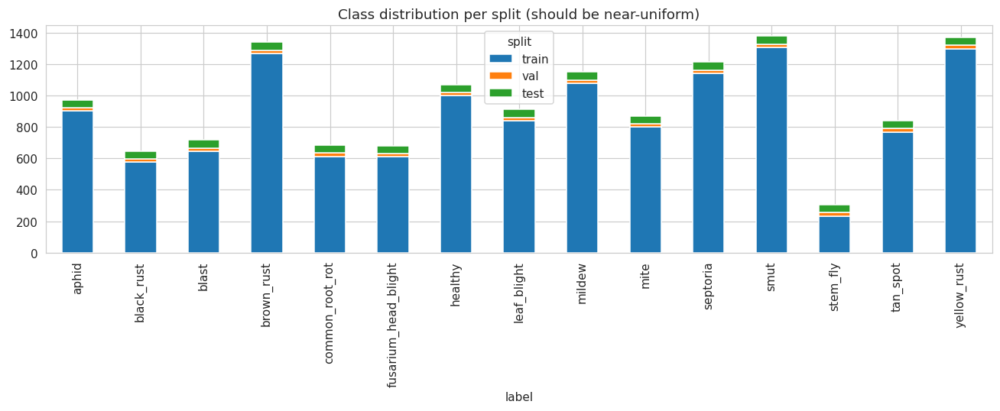

Train imbalance ratio: 5.6


In [5]:
ct.plot(kind="bar", stacked=True, figsize=(12,5))
plt.title("Class distribution per split (should be near-uniform)")
plt.tight_layout(); plt.show()
print("Train imbalance ratio:", round(ct["train"].max()/ct["train"].min(), 2))

# **Sample images per class (visual inspection)**

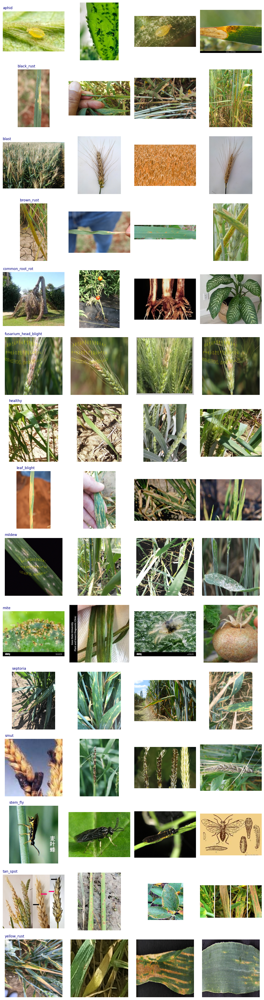

In [7]:
def show_samples(df, n_per_class=4, classes=None):
    classes = classes or sorted(df["label"].unique())
    nrow, ncol = len(classes), n_per_class
    fig, axes = plt.subplots(nrow, ncol, figsize=(ncol * 2.4, nrow * 2.4))
    axes = np.atleast_2d(axes)
    for r, cls in enumerate(classes):
        pool = df[df["label"] == cls]
        sub = pool.sample(min(n_per_class, len(pool)), random_state=42)
        for c in range(ncol):
            ax = axes[r, c]; ax.axis("off")
            if c < len(sub):
                try:
                    ax.imshow(Image.open(sub.iloc[c]["filepath"]).convert("RGB"))
                except Exception:
                    ax.text(0.5, 0.5, "ERR", ha="center")
            if c == 0:
                ax.set_title(cls, fontsize=9, loc="left", color="navy")
    plt.tight_layout(); plt.show()

show_samples(df, n_per_class=4)

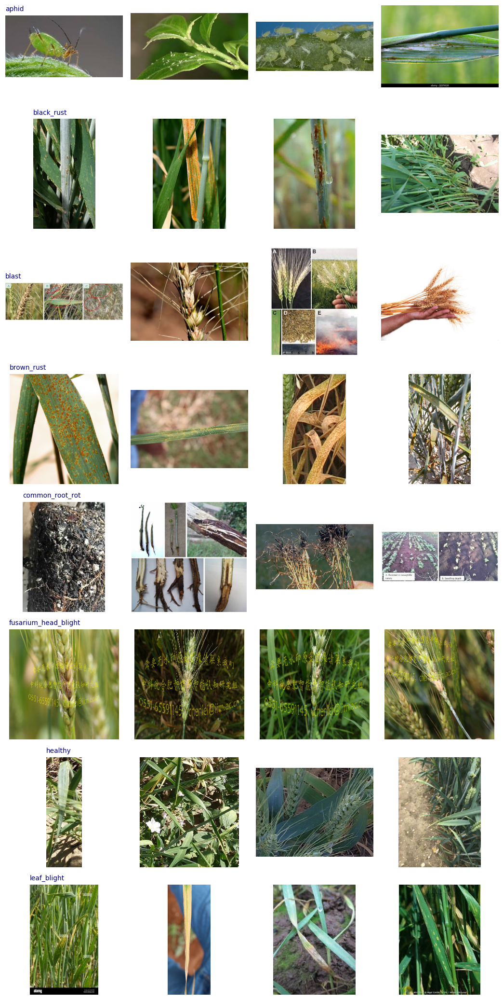

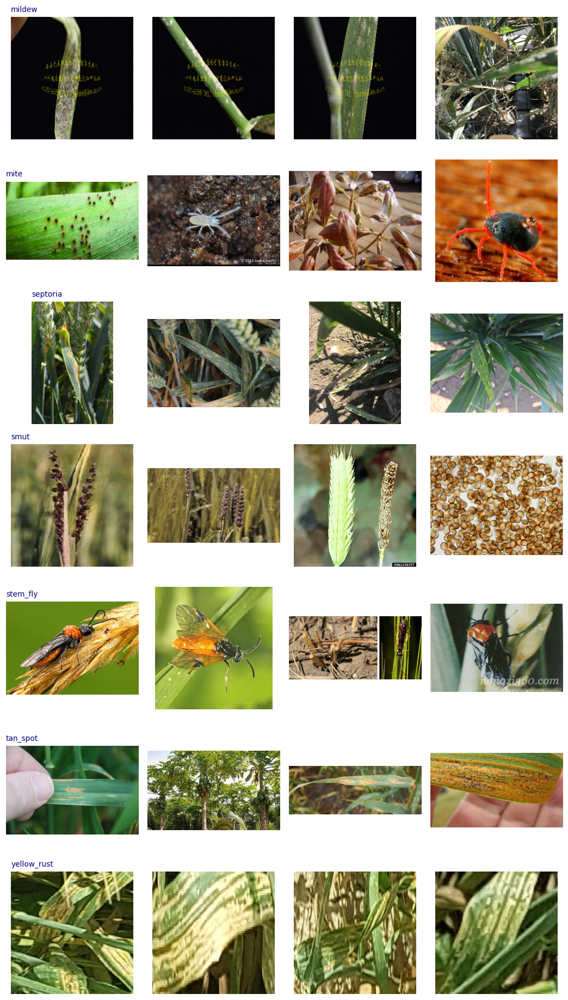

In [8]:
classes = sorted(df["label"].unique())
show_samples(df[df.split=="train"], 4, classes[:8])
show_samples(df[df.split=="train"], 4, classes[8:])

# **Image properties: size, resolution, format, corrupt files**

Reading metadata:   0%|          | 0/14154 [00:00<?, ?it/s]

Corrupt/unreadable images: 0
          width    height    aspect   size_kb
count  14154.00  14154.00  14154.00  14154.00
mean     716.00    674.38      1.21    454.38
std     1053.14    981.63      0.63   1104.98
min       44.00     31.00      0.09      2.59
25%      256.00    227.00      0.87     13.13
50%      276.00    256.00      1.00     73.72
75%      709.00    620.00      1.50    274.75
max     6016.00   6600.00     18.23  10616.21

Modes:
 mode
RGB     12492
RGBA     1613
P          47
CMYK        2
Name: count, dtype: int64

Formats:
 format
JPEG    9076
PNG     5027
WEBP      37
GIF       10
MPO        4
Name: count, dtype: int64

Top resolutions:
 256x256      3297
709x945       513
275x183       468
259x194       365
709x471       352
6000x4000     289
738x491       267
567x756       203
194x259       177
300x168       118
Name: count, dtype: int64


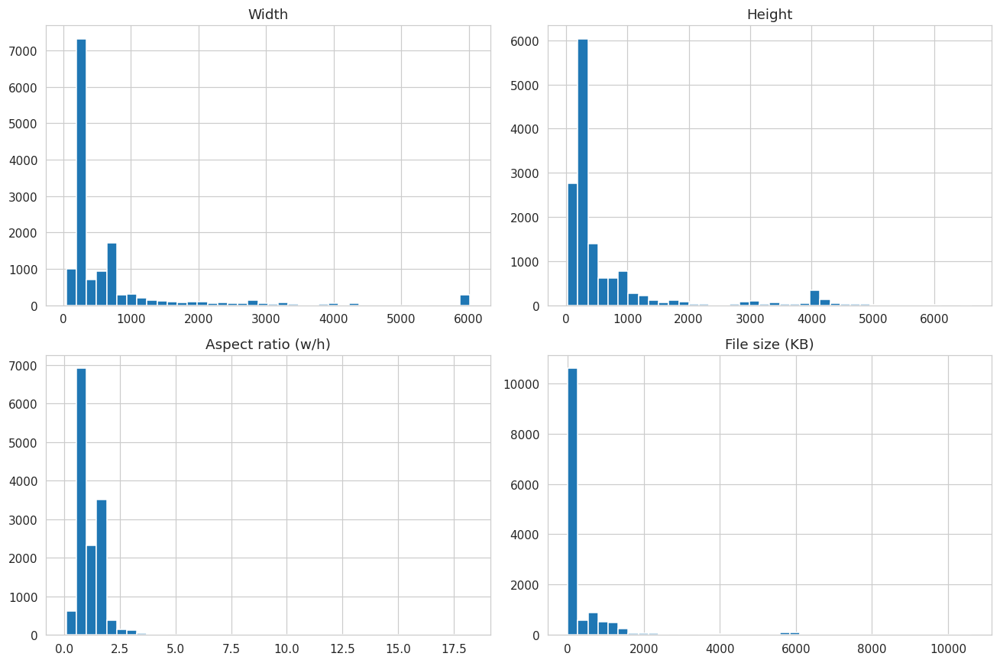

In [13]:
from tqdm.auto import tqdm

meta = []
for fp in tqdm(df["filepath"], desc="Reading metadata"):
    try:
        with Image.open(fp) as im:
            w, h, mode, fmt = im.width, im.height, im.mode, im.format
        meta.append((w, h, mode, fmt, os.path.getsize(fp) / 1024, None))
    except Exception as e:
        meta.append((None, None, None, None, None, str(e)))

df = pd.concat([df.reset_index(drop=True),
                pd.DataFrame(meta, columns=["width","height","mode","format","size_kb","error"])],
               axis=1)

corrupt = df[df["error"].notna()]
print("Corrupt/unreadable images:", len(corrupt))
if len(corrupt): display(corrupt[["filepath", "error"]].head(20))

ok = df[df["width"].notna()].copy()
ok["aspect"] = ok["width"] / ok["height"]
print(ok[["width","height","aspect","size_kb"]].describe().round(2))
print("\nModes:\n", df["mode"].value_counts())
print("\nFormats:\n", df["format"].value_counts())
print("\nTop resolutions:\n",
      (ok["width"].astype(int).astype(str) + "x" + ok["height"].astype(int).astype(str)).value_counts().head(10))

fig, ax = plt.subplots(2, 2, figsize=(12, 8))
ax[0,0].hist(ok["width"],  bins=40); ax[0,0].set_title("Width")
ax[0,1].hist(ok["height"], bins=40); ax[0,1].set_title("Height")
ax[1,0].hist(ok["aspect"], bins=40); ax[1,0].set_title("Aspect ratio (w/h)")
ax[1,1].hist(ok["size_kb"],bins=40); ax[1,1].set_title("File size (KB)")
plt.tight_layout(); plt.show()

# **Duplicate detection + train/test leakage**

In [12]:
from tqdm.auto import tqdm
def ahash(fp, size=8):
    try:
        px = np.asarray(Image.open(fp).convert("L").resize((size, size), Image.BILINEAR), dtype=np.float32)
        return "".join((px > px.mean()).astype(int).astype(str).flatten())
    except Exception:
        return None

df["ahash"] = [ahash(fp) for fp in tqdm(df["filepath"], desc="Hashing")]
h = df.dropna(subset=["ahash"])
dups = h[h["ahash"].duplicated(keep=False)]
print("Potential duplicate groups:", dups["ahash"].nunique(), "|", len(dups), "images")

for hsh, grp in df.loc[dups.index].groupby("ahash"):
    if len(grp) > 1:
        print(grp[["filename","label","split"]].to_dict("records")); break  # show one example group

if df["split"].nunique() > 1:
    per_h = df.loc[dups.index].groupby("ahash")["split"].nunique()
    print("\n⚠️ Hashes appearing in >1 split (leakage risk):", int((per_h > 1).sum()))

Hashing:   0%|          | 0/14154 [00:00<?, ?it/s]

Potential duplicate groups: 2177 | 6279 images
[{'filename': 'septoria_352.png', 'label': 'septoria', 'split': 'train'}, {'filename': 'septoria_894.png', 'label': 'septoria', 'split': 'train'}, {'filename': 'septoria_513.png', 'label': 'septoria', 'split': 'train'}]

⚠️ Hashes appearing in >1 split (leakage risk): 646


# **Color & brightness per class (sampled for speed)**

/tmp/ipykernel_58/1644540237.py:3: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return d.groupby("label", group_keys=False).apply(lambda g: g.sample(min(n, len(g)), random_state=42))


Color stats: 0it [00:00, ?it/s]

                          R      G      B  brightness
label                                                
aphid                 119.7  136.6   80.5       125.1
black_rust            122.8  121.4   87.5       118.0
blast                 144.6  139.8  112.7       138.1
brown_rust            130.5  125.3   80.6       121.8
common_root_rot       123.8  124.1  103.8       121.7
fusarium_head_blight  110.2  115.4   69.9       108.7
healthy               118.0  123.0   89.6       117.7
leaf_blight           110.5  120.6   79.9       112.9
mildew                 80.6   91.6   67.4        85.6
mite                  127.4  135.9   95.2       128.7
septoria               95.3  103.1   85.3        98.8
smut                  116.8  132.6  103.5       124.5
stem_fly              115.6  133.9   90.9       123.5
tan_spot              114.7  124.7   78.4       116.4
yellow_rust           109.9  117.9   74.3       110.5


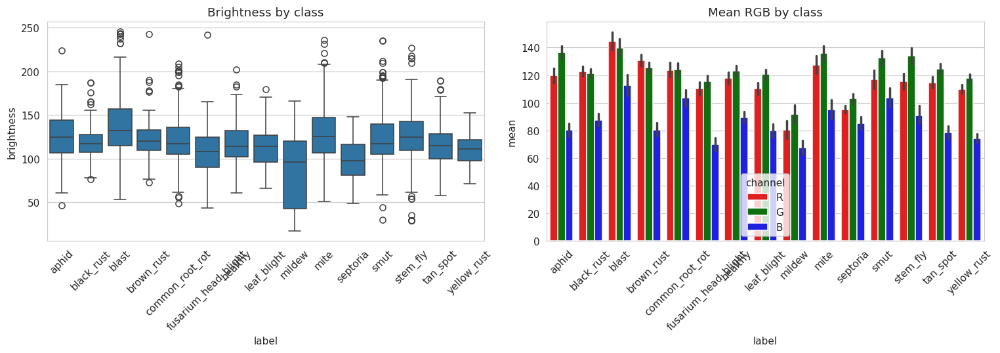

In [14]:
SAMPLE_PER_CLASS = 150
def sample_per_class(d, n):
    return d.groupby("label", group_keys=False).apply(lambda g: g.sample(min(n, len(g)), random_state=42))

rows = []
for _, r in tqdm(sample_per_class(df[df.error.isna()], SAMPLE_PER_CLASS).iterrows(), desc="Color stats"):
    try:
        R, G, B = ImageStat.Stat(Image.open(r["filepath"]).convert("RGB")).mean
        rows.append((r["label"], R, G, B, 0.299*R + 0.587*G + 0.114*B))
    except Exception:
        pass
cdf = pd.DataFrame(rows, columns=["label","R","G","B","brightness"])
print(cdf.groupby("label")[["R","G","B","brightness"]].mean().round(1))

fig, ax = plt.subplots(1, 2, figsize=(14, 5))
sns.boxplot(data=cdf, x="label", y="brightness", ax=ax[0]); ax[0].set_title("Brightness by class")
ax[0].tick_params(axis="x", rotation=45)
melt = cdf.melt(id_vars="label", value_vars=["R","G","B"], var_name="channel", value_name="mean")
sns.barplot(data=melt, x="label", y="mean", hue="channel", palette=["red","green","blue"], ax=ax[1])
ax[1].set_title("Mean RGB by class"); ax[1].tick_params(axis="x", rotation=45)
plt.tight_layout(); plt.show()

# **Blur / sharpness (Laplacian variance) — flags low-quality images**

/tmp/ipykernel_58/1644540237.py:3: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return d.groupby("label", group_keys=False).apply(lambda g: g.sample(min(n, len(g)), random_state=42))


Sharpness: 0it [00:00, ?it/s]

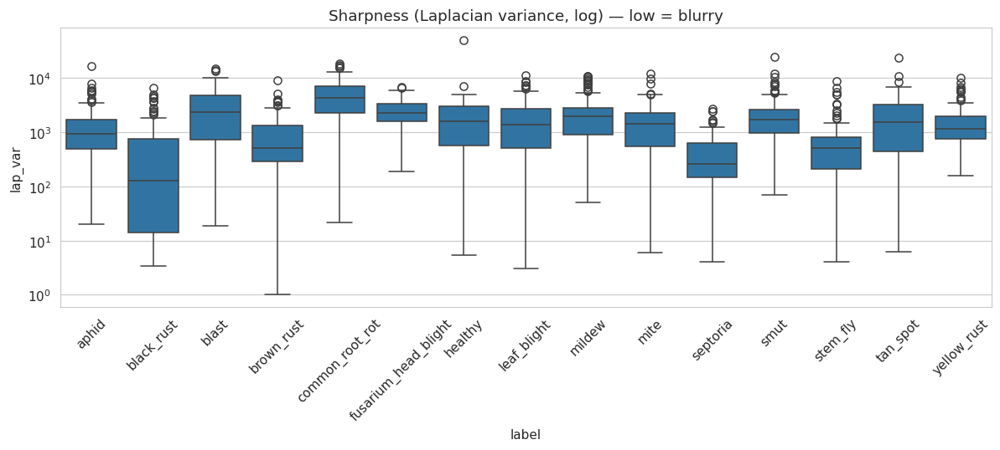

Blurriest samples:
             label   lap_var
446    brown_rust  1.010678
417    brown_rust  2.694622
840   leaf_blight  3.029919
884   leaf_blight  3.312543
176    black_rust  3.406557
197    black_rust  3.596764
151    black_rust  3.644520
908   leaf_blight  3.846253
874   leaf_blight  3.988230
1226     septoria  4.051942


In [15]:
import cv2
brows = []
for _, r in tqdm(sample_per_class(df[df.error.isna()], 120).iterrows(), desc="Sharpness"):
    g = cv2.imread(r["filepath"], cv2.IMREAD_GRAYSCALE)
    if g is not None:
        brows.append((r["label"], cv2.Laplacian(g, cv2.CV_64F).var()))
bdf = pd.DataFrame(brows, columns=["label","lap_var"])
plt.figure(figsize=(11, 5))
sns.boxplot(data=bdf, x="label", y="lap_var"); plt.yscale("log"); plt.xticks(rotation=45)
plt.title("Sharpness (Laplacian variance, log) — low = blurry"); plt.tight_layout(); plt.show()
print("Blurriest samples:\n", bdf.sort_values("lap_var").head(10))

# **Save enriched metadata for reuse**

In [16]:
df.to_csv("/kaggle/working/wheat_image_metadata.csv", index=False)
print("Saved metadata to /kaggle/working/wheat_image_metadata.csv")

Saved metadata to /kaggle/working/wheat_image_metadata.csv
